In [24]:
import torch
import torchvision
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt
import torchvision.models as models
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import cv2

In [25]:
SEED = 1

# Use GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print('Current Device:', device)

Current Device: cpu


In [26]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]     # ImageNet mean and std
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORMS = transforms.Compose(
    [
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ]
)

In [27]:
from models.model import Resnet18

model = Resnet18()
model.load_state_dict(torch.load('./models/default_resnet18.pth', map_location=device))
model.eval()
print('Model loaded successfully.')

Model loaded successfully.


In [28]:
params = list(model.parameters())
weight = np.squeeze(params[-2].data.cpu().numpy())
print(params[-2].shape)
print(weight.shape)

torch.Size([1000, 512])
(1000, 512)


In [29]:
# Displays CAM and prediction.
#  img:           numpy array with shape (img_height, img_width, img_channels)
#  target_class:  prediction class
def cam(img, model=model, target_class=1):
    model.eval()

    img_transforms = transforms.Compose([
        transforms.ToPILImage(),
        IMAGENET_TRANSFORMS
    ])
    sample_img = img_transforms(img)

    sample_img = torch.autograd.Variable(sample_img.unsqueeze(0)) # What does autograd.Variable do?
    sample_img = sample_img.to(device)
    model.to(device)
    feats = model.get_features(sample_img).data.cpu().numpy()
    
    # Get prediction probability for target class
    output = model(sample_img)
    logits = F.softmax(output, dim=1).squeeze()
    pred_logit = logits[target_class].item()
    print('Probability: {:.5f}%'.format(pred_logit*100))

    _, nc, h, w = feats.shape
    r = feats.reshape((nc, h*w))

    c = weight[target_class].dot(r)
    c = c.reshape((h, w))
    c = c - np.min(c)
    c = c / np.max(c)
    c_i = np.uint8(255 * c)
    c_i = cv2.resize(c_i, (img.shape[1], img.shape[0]))

    #img = np.uint8(255 * img) # What does this line do?
    img = np.uint8(img)       #   I found that this line works better instead
    heatmap = cv2.cvtColor(cv2.applyColorMap(c_i, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
    result = np.uint8(0.3 * heatmap + 0.5 * img)

    # Plot original image and CAM side-by-side
    plt.figure(1, figsize=(12,8))
    img_plot = plt.subplot(121)
    img_plot.axis('off')
    img_plot.imshow(img)
    cam_plot = plt.subplot(122)
    cam_plot.axis('off')
    cam_plot.imshow(result)
    plt.show()

In [30]:
IMAGENET_CHAINSAW_CLASS = 491

In [31]:
chainsaws = [
    'datasets/imagenette/imagenette2/val/n03000684/ILSVRC2012_val_00011951.JPEG',
    'datasets/imagenette/imagenette2/val/n03000684/n03000684_35991.JPEG'
]

not_chainsaws = [
    'datasets/imagenette/imagenette2/val/n03394916/ILSVRC2012_val_00007921.JPEG',
    'datasets/imagenette/imagenette2/val/n03445777/n03445777_261.JPEG',
    'examples/tabby_cat.jpg'
]

Probability: 87.75302%


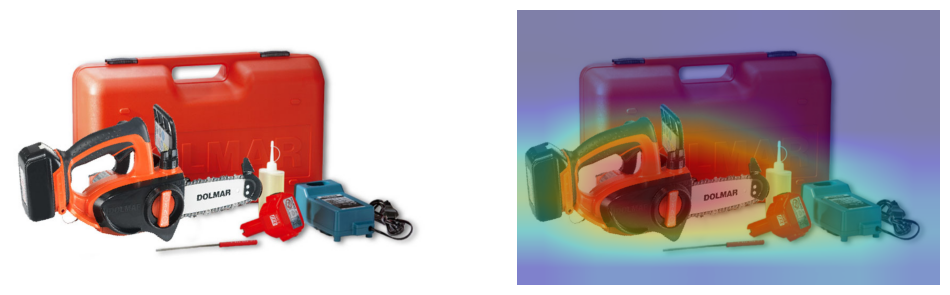

Probability: 89.55557%


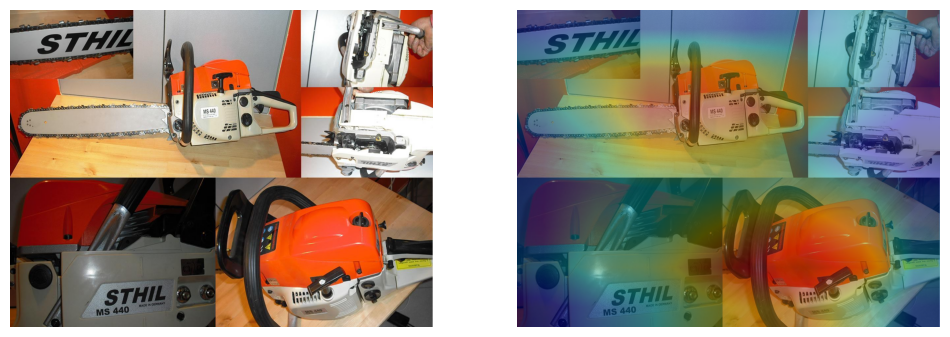

In [33]:
for im_path in chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model, IMAGENET_CHAINSAW_CLASS)

Probability: 0.00040%


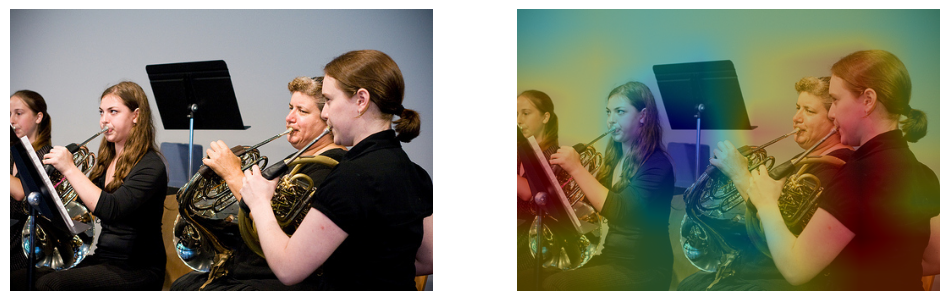

Probability: 0.00119%


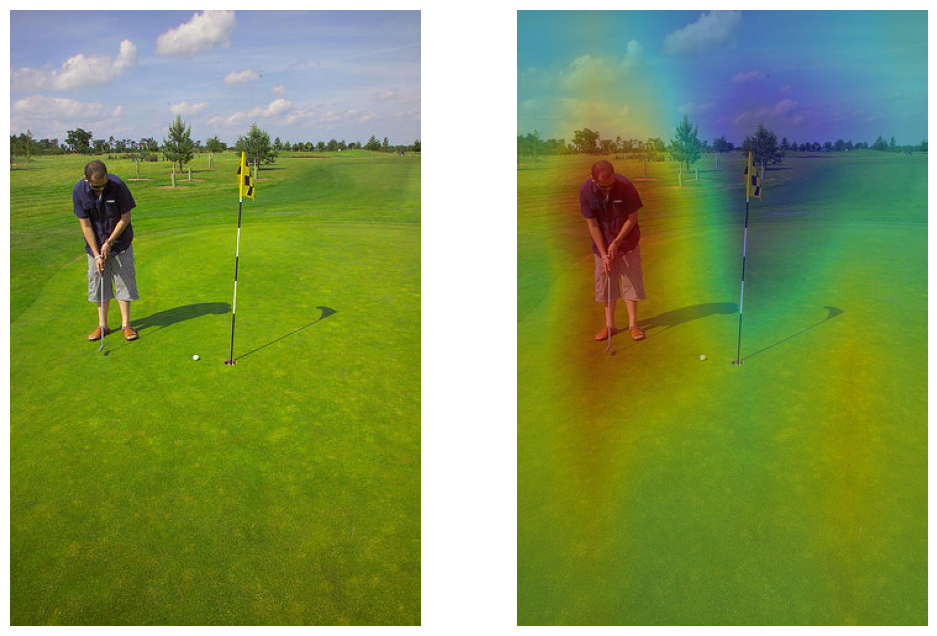

Probability: 0.00076%


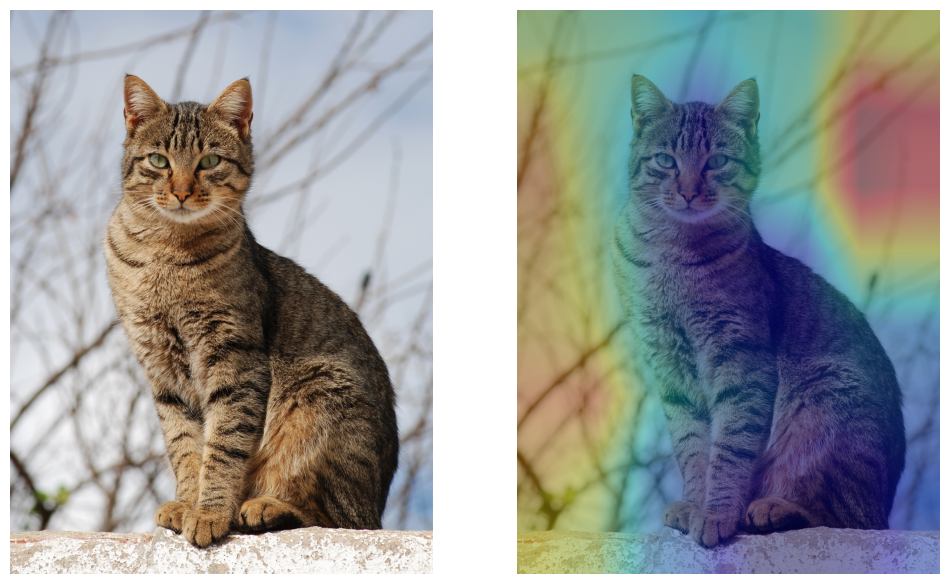

In [34]:
for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model, IMAGENET_CHAINSAW_CLASS)

Probability: 0.00005%


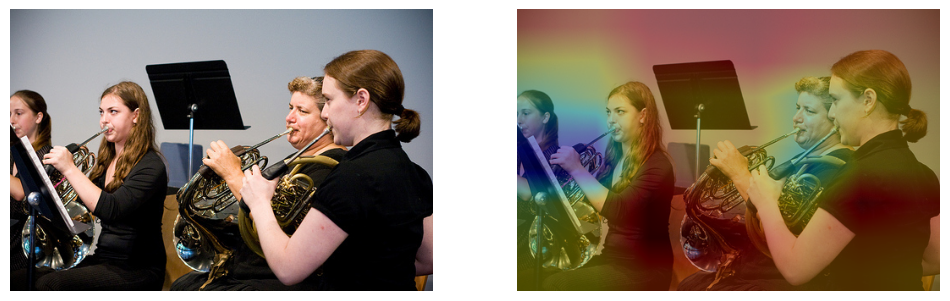

Probability: 0.00008%


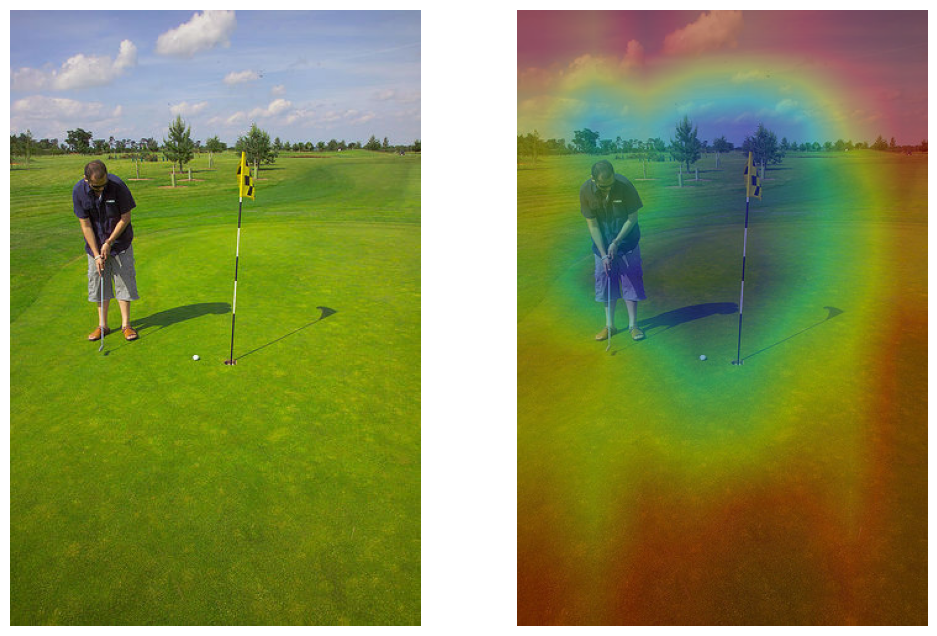

Probability: 29.61389%


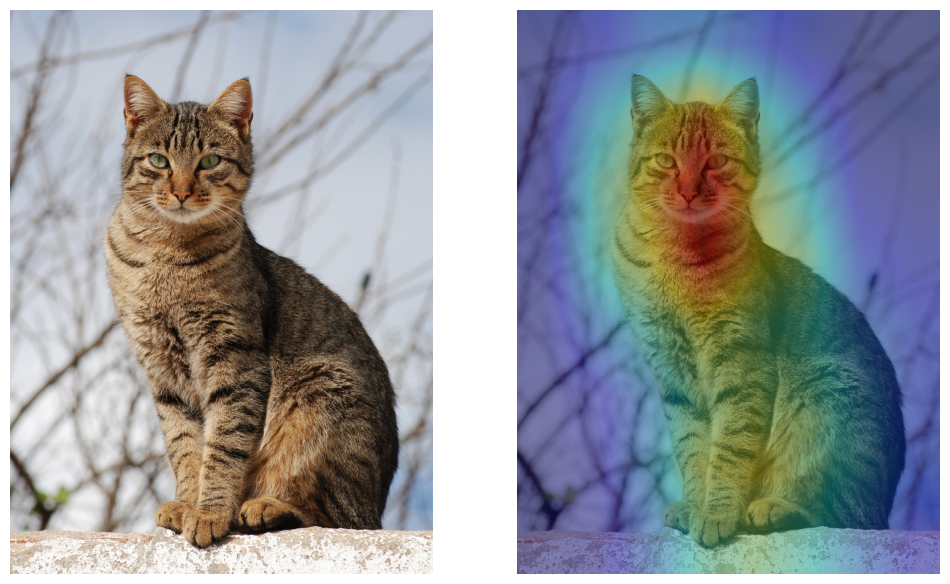

In [35]:
IMAGENET_TABBY_CLASS = 281

for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model, IMAGENET_TABBY_CLASS)

In [47]:
from models.model import CNNClassifier

model = CNNClassifier(num_classes=2)
model.load_state_dict(torch.load('./models/emergency_vehicles.pth', map_location=device))
model.eval()
print('Model loaded successfully.')

Model loaded successfully.


In [ ]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/20.jpg',
    './examples/emergency_vehicles/23.jpg',
    './examples/emergency_vehicles/2287.jpg',
    './examples/emergency_vehicles/2293.jpg',
    './examples/emergency_vehicles/2309.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg'
]

Probability: 100.00000%


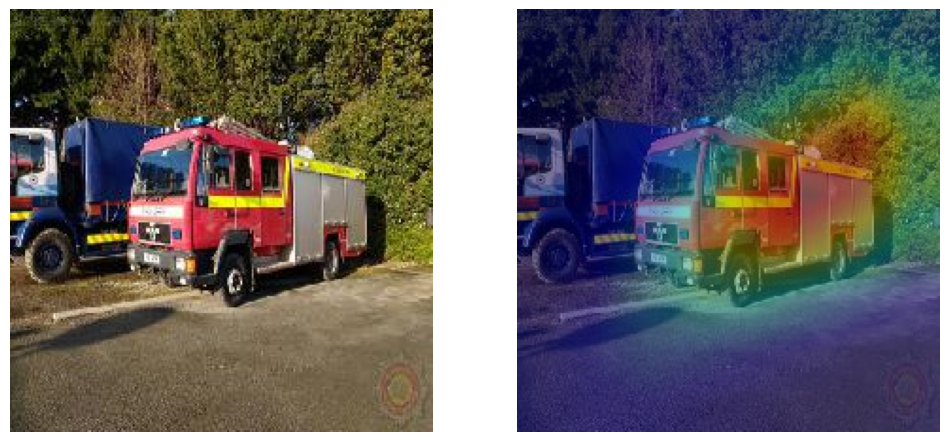

Probability: 100.00000%


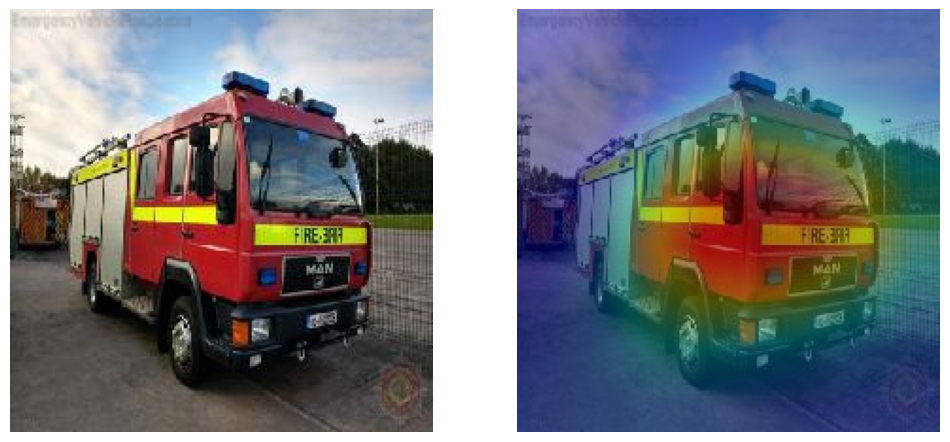

Probability: 100.00000%


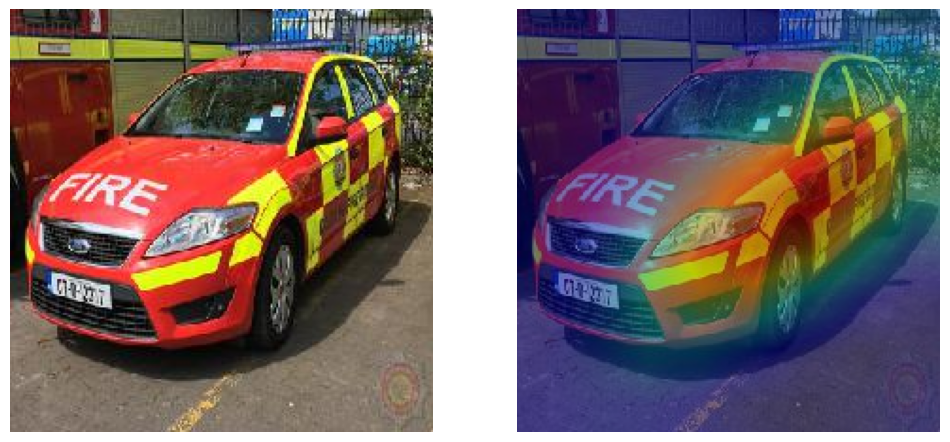

Probability: 100.00000%


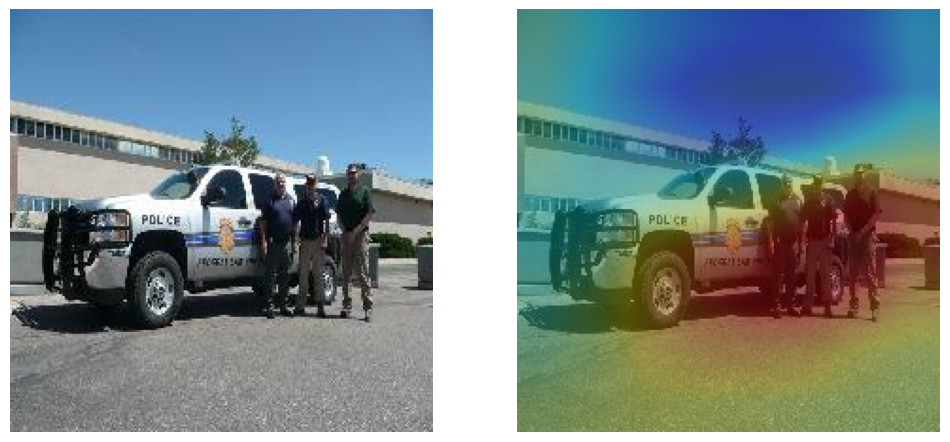

Probability: 100.00000%


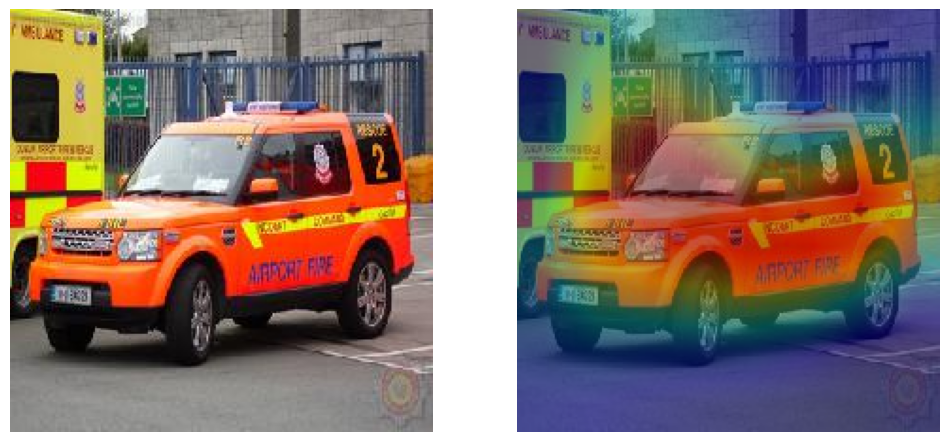

Probability: 100.00000%


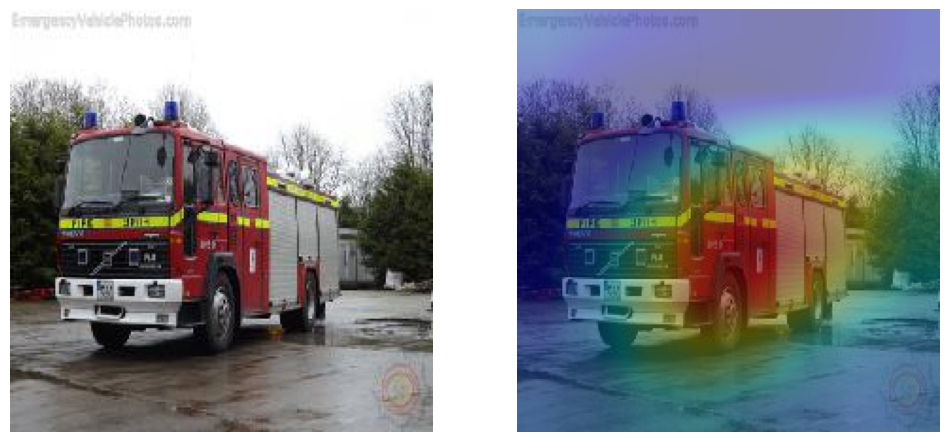

In [ ]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model, target_class=0)